# Part 2a: Existing food landscapes
The following notebook explores the existing food landscapes in DC. We can begin to make connections with demographics, indicating access along the lines of race and income. This will allow us to see if different wards experience inequities in food access.

Like part 1, we need to import relevant data libraries (pandas, geopandas, folium, matplotlib, and contextily)

In [1]:
# import libraries
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import contextily as ctx
import plotly.express as px

## Charting food indicators
Our first food landscape relates to "healthy" foods. We will produce charts and maps that display indicators of both healthy and unhealthy foods.

First, let's import some data to create charts

In [2]:
gsl = pd.read_csv('Grocery_Store_Locations.csv') # import the data
liquor= pd.read_csv('Liquor_Licenses.csv')

Now that we have some food environment libraries and datasets are imported, let's clean and explore the grocery store locations dataset first.

In [3]:
# count columns and rows
gsl.shape

(82, 36)

In [4]:
# datatypes
gsl.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82 entries, 0 to 81
Data columns (total 36 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   X                 82 non-null     float64
 1   Y                 82 non-null     float64
 2   STORENAME         82 non-null     object 
 3   ADDRESS           82 non-null     object 
 4   ZIPCODE           82 non-null     int64  
 5   PHONE             82 non-null     int64  
 6   WARD              82 non-null     object 
 7   SSL               82 non-null     object 
 8   NOTES             53 non-null     object 
 9   PRESENT90         55 non-null     object 
 10  PRESENT95         55 non-null     object 
 11  PRESENT00         55 non-null     object 
 12  PRESENT05         55 non-null     object 
 13  PRESENT08         55 non-null     object 
 14  PRESENT09         55 non-null     object 
 15  PRESENT10         55 non-null     object 
 16  PRESENT11         55 non-null     object 
 17 

As-is, the grocery store locations dataset includes 82 rows of data and 36 column categories. Using the Open Data DC dictionary for grocery store locations, I can tell that this dataset includes descriptive information on which grocery retailers are present, spatial information on where groceries are located by zip code and ward, and temporal information on which grocery retailers were present during given years. I'll now clean the dataset by dropping empty columns and identifying columns to keep based on the data dictionary to create a trimmed subset.

In [5]:
# identify empty columns
gsl.columns[gsl.isna().all()].tolist()

['SE_ANNO_CAD_DATA']

In [6]:
# drop empty columns and check data
gsl = gsl.dropna(axis=1, how="all")
gsl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82 entries, 0 to 81
Data columns (total 35 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   X          82 non-null     float64
 1   Y          82 non-null     float64
 2   STORENAME  82 non-null     object 
 3   ADDRESS    82 non-null     object 
 4   ZIPCODE    82 non-null     int64  
 5   PHONE      82 non-null     int64  
 6   WARD       82 non-null     object 
 7   SSL        82 non-null     object 
 8   NOTES      53 non-null     object 
 9   PRESENT90  55 non-null     object 
 10  PRESENT95  55 non-null     object 
 11  PRESENT00  55 non-null     object 
 12  PRESENT05  55 non-null     object 
 13  PRESENT08  55 non-null     object 
 14  PRESENT09  55 non-null     object 
 15  PRESENT10  55 non-null     object 
 16  PRESENT11  55 non-null     object 
 17  PRESENT12  55 non-null     object 
 18  PRESENT13  55 non-null     object 
 19  PRESENT14  55 non-null     object 
 20  PRESENT15  5

In [7]:
# columns to keep based on data dictionary
columns_to_keep = ['X','Y','STORENAME','ZIPCODE','WARD','XCOORD','YCOORD']
# check data
gsl[columns_to_keep].sample(5)

,X,Y,STORENAME,ZIPCODE,WARD,XCOORD,YCOORD
73,-76.992431,38.919230,Giant,20018,Ward 5,400656.59,139039.13
37,-76.982013,38.916268,Target,20002,Ward 5,401560.12,138710.47
12,-77.095759,38.945722,Wagshal’s Market,20016,Ward 3,391699.01,141984.27
8,-77.083861,38.956303,Rodman’s,20016,Ward 3,392731.53,143157.89
25,-77.032986,38.929308,Target,20010,Ward 1,397140.04,140158.41


In [8]:
# new variable for cleaned data
gsl_clean = gsl[columns_to_keep].copy()
gsl_clean = gsl_clean.dropna()
gsl_clean.head(3)

,X,Y,STORENAME,ZIPCODE,WARD,XCOORD,YCOORD
0,-77.026981,38.984455,Target,20012,Ward 4,397662.57,146280.07
1,-77.026066,38.983464,International Progresso Market,20012,Ward 4,397741.80,146169.97
2,-77.027798,38.967771,Jocelyn’s Market,20012,Ward 4,397591.16,144428.00


Now that we have a subset of my grocery store data, we want to generate a chart to show how many grocery stores there are by ward. To start, we'll use our cleaned dataset, and sort the ward numbers so they appear in ascending order, just for visual clarity.

In [9]:
# create variable to sort by ward
gsl_ward = gsl_clean.sort_values(by='WARD', ascending=True)
gsl_ward.head(10)

,X,Y,STORENAME,ZIPCODE,WARD,XCOORD,YCOORD
26,-77.040994,38.924215,Safeway,20009,Ward 1,396445.44,139593.32
21,-77.023796,38.931156,Panam Grocery,20010,Ward 1,397936.98,140363.25
25,-77.032986,38.929308,Target,20010,Ward 1,397140.04,140158.41
28,-77.043711,38.921804,Yes! Organic,20009,Ward 1,396209.70,139325.82
31,-77.032085,38.920762,Streets Market,20009,Ward 1,397217.80,139209.69
32,-77.043542,38.920756,Streets Market,20009,Ward 1,396224.29,139209.43
33,-77.024868,38.919757,Whole Foods,20001,Ward 1,397861.50,139107.39
34,-77.031620,38.918507,Yes! Organic,20009,Ward 1,397258.09,138959.31
72,-77.038442,38.921987,Harris Teeter,20009,Ward 1,396666.63,139345.87
22,-77.031924,38.930822,Giant,20010,Ward 1,397232.21,140326.39


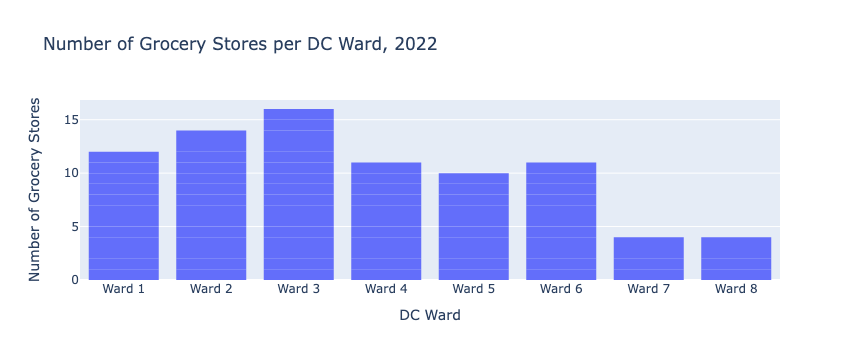

In [10]:
# create a chart
fig = px.bar(gsl_ward,
             x='WARD',
             title='Number of Grocery Stores per DC Ward, 2022',
             labels={
                 'WARD':'DC Ward',
                 'count':'Number of Grocery Stores'
             }
            )
# remove white lines
fig.update_traces(marker_line_width=0)
# show figure
fig.show()

It looks like Ward 3 has the highest number of grocery stores, with Wards 7 and 8 having the lowest number of grocery stores. In our other notebooks, we know that Wards 2 and 3 have majority White and/or higher-income, residents compared to Wards 7 and 8, which have majority Black and/or lower-income residents. The stark contrast in number of grocery stores and preliminary understanding of demographics by ward indicates that resource allocation in DC, including food resources, has been racialized and operationalized by wealth.

Now, we want to chart "unhealthy" food resources, as indicated by liquor retailers. Start by taking an initial look at the dataset, and then conducting some cleaning.

In [11]:
# count columns and rows
liquor.shape

(2243, 41)

In [12]:
# datatypes
liquor.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2243 entries, 0 to 2242
Data columns (total 41 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   X                  2243 non-null   float64
 1   Y                  2243 non-null   float64
 2   LICENSE            2243 non-null   object 
 3   APPLICANT          2243 non-null   object 
 4   TRADE_NAME         2243 non-null   object 
 5   CLASS              2243 non-null   object 
 6   ADDRESS            2243 non-null   object 
 7   ZIPCODE            2243 non-null   int64  
 8   WARD               2243 non-null   object 
 9   ANC                2243 non-null   object 
 10  SMD                2243 non-null   object 
 11  STATUS             2243 non-null   object 
 12  TYPE               2243 non-null   object 
 13  BREW_PUB           9 non-null      object 
 14  ENTERTAINMENT      727 non-null    object 
 15  SALES_CONSUMPTION  17 non-null     object 
 16  SIDEWALK_CAFE      521 n

As-is, the liquor retailers dataset includes 2243 rows of data and 41 column categories. Using the Open Data DC dictionary for liquor retailer locations, we can tell that this dataset includes descriptive information on the different types of liquor retailers and spatial information on where liquor retailers are located by zip code and ward. We'll now clean the dataset by ensuring my datatypes are correct (e.g. values that need to be in 'str' because they do not hold numeric value), dropping empty columns, and identifying columns to keep using the data dictionary to create a trimmed subset.

In [13]:
# identify columns to keep based on data dictionary
columns_to_keep3 = ['X','Y','ZIPCODE','WARD','TYPE','XCOORD','YCOORD','LONGITUDE','LATITUDE']
# new variable for cleaned data
liquor_clean=liquor[columns_to_keep3].copy()
liquor_clean=liquor_clean.dropna()
# check data
liquor_clean.head(5)

,X,Y,ZIPCODE,WARD,TYPE,XCOORD,YCOORD,LONGITUDE,LATITUDE
0,-77.031549,38.897027,20045,Ward 2,Club,397263.41,136574.85,-77.031547,38.897019
1,-77.083582,38.957499,20015,Ward 3,Retail - Liquor Store,392755.85,143290.69,-77.083579,38.957492
2,-77.026685,38.906238,20001,Ward 2,Retail - Liquor Store,397685.66,137597.25,-77.026682,38.906231
3,-77.047696,38.896311,20037,Ward 2,Retail - Liquor Store,395862.69,136495.99,-77.047693,38.896303
4,-77.036162,38.905004,20036,Ward 2,Club,396863.57,137460.50,-77.036160,38.904996


Similar to the processes above, we want to create a new column that counts the unique types of liquor retailers available in DC.

In [14]:
# add count column by type
# identify unique type values
liquor_clean.TYPE.unique().tolist()

['Club',
 'Retail - Liquor Store',
 'Restaurant',
 'Tavern',
 'Hotel',
 'Nightclub',
 'Multipurpose',
 'Retail - Grocery',
 'Marine Vessel',
 'Retail-Full Service Grocery',
 'Wholesaler',
 'Arena',
 'Caterer',
 'Retail - Class B',
 'Manufacturer',
 'Internet',
 'Retail-Liquor Store',
 '25 Percent',
 'Beer and Wine',
 'Railroad',
 'Retail - Full Service Grocery',
 'Retail-Class B']

In [15]:
# counting type of places that sell liquor
liquor_clean=liquor_clean.value_counts('TYPE').reset_index(name='count')
liquor_clean

,TYPE,count
0,Restaurant,886
1,Tavern,437
2,Retail - Liquor Store,217
3,Retail - Grocery,117
4,Hotel,107
5,Caterer,102
6,Retail-Full Service Grocery,52
7,Wholesaler,47
8,Nightclub,44
9,Internet,42


Now that we have a subset of our liquor retailers data, we want to generate a charts to show how these types are distributed by ward.

In [16]:
# create a grouped variable
liquor_ward = liquor.value_counts(['WARD','TYPE']).reset_index(name='count')
liquor_ward

,WARD,TYPE,count
0,Ward 2,Restaurant,397
1,Ward 6,Restaurant,139
2,Ward 1,Restaurant,124
3,Ward 2,Tavern,121
4,Ward 1,Tavern,121
...,...,...,...
113,Ward 3,25 Percent,1
114,Ward 7,Internet,1
115,Ward 7,Caterer,1
116,Ward 7,Beer and Wine,1


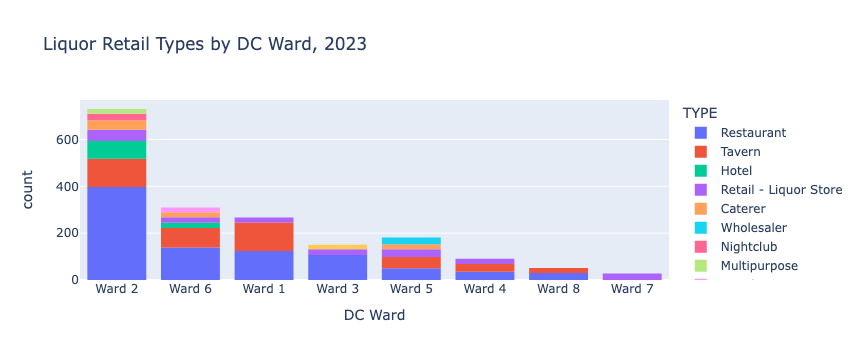

In [17]:
# create stacked chart
fig = px.bar(liquor_ward.head(30),
             x='WARD',
             y='count',
             color='TYPE',
             title='Liquor Retail Types by DC Ward, 2023',
             labels={
                 'WARD':'DC Ward'
             }
            )
# remove white lines
fig.update_traces(marker_line_width=0)
fig.show()

The chart above shows how different liquor retailer types are distributed per ward. From this chart, I can observe that Ward 2 has the most liquor retail providers, compared to Ward 7. However, Ward 2 also has the greatest concentration of restaurants as liquor providers, whereas Ward 7 has liquor stores only. This is an indicator that while there may be more liquor access in Ward 2, there are more diverse amenities compared against Ward 7, which has a disproportionate concentration of liquor stores compared against any other amenity type. When we compare this chart with the count of grocery stores by ward, we observe that Wards 2 and 3 both have higher access to liquor and groceries, but that their liquor access is primarily through the restaurant industry, whereas Wards 7 and 8 both have lower access to liquor and groceries, but that their liquor access is disproportionately represented through liquor stores.

Our takeaways include:

When looking at liquor retailers specifically, there is greater liquor access in Wards 2 and 3 compared to Wards 7 and 8. However, the diversity of liquor retailers is much greater in Wards 2 and 3 (which are also higher-income wards) whereas the concentration of liquor stores specifically is much higher in Ward 8 (which is also a majority Black, lower-income ward).
When looking at grocery stores specifically, there is similarly, greater grocery access in Wards 2 and 3 compared to Wards 7 and 8. There are also distinct differences by race and income, which we presume plays a role in resource allocation and distribution.

## Mapping food landscapes
Now that we have created some charts related to food access, we want to spatially analyze food landscapes, for both healthy and unhealthy food.

### Healthy food access (Open Data DC)
There are a number of indicators for healthy food access. One component of that is grocery store locations. While grocery store locations are a critical component for food access, we know that food access goes beyond just grocery stores. So, we want to consider other locations that can provide food access in the city. This includes: farmer's markets, community gardens, and "healthy" fast food restaurants. Our higher goal in assessing the existing food landscape in D.C. is to understand specifically healthy food access.

First, we'll import our data sets from Open Data DC on food. We want to overlay these locations on top of DC wards, so we also need to import ward data.

In [18]:
# import data
healthy= pd.read_csv('Healthy_Corner_Stores.csv') 
farmers= pd.read_csv('Farmers_Market_Locations.csv') 
gardens=pd.read_csv('Community_Gardens.csv')
wards= gpd.read_file('Wards_from_2012.geojson')

We will run a head function on these new data sets so that we know the column names, which are important when mapping. We actually don't need to clean the data, because we know exactly what columns we need: X, Y, and any column indicating the name of the location.

In [19]:
gsl.head(1)

,X,Y,STORENAME,ADDRESS,ZIPCODE,PHONE,WARD,SSL,NOTES,PRESENT90,...,OBJECTID,XCOORD,YCOORD,MAR_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,PRESENT22
0,-77.026981,38.984455,Target,7828 GEORGIA AVENUE NW,20012,2028923822,Ward 4,2960 0017,NaN,NaN,...,641,397662.57,146280.07,300512,{CE302122-4E8D-4DC7-845B-06563B993F66},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes


In [20]:
healthy.head(1)

,X,Y,OBJECTID,STORE,ADDRESS,XCOORD,YCOORD,MATCHTYPE,MAR_ID,LATITUDE,LONGITUDE,GIS_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED
0,-77.019079,38.975046,1,BP Blaire Gas Station,7000 Blair Rd NW,398346.95,145235.41,Exact,249127.0,38.975039,-77.019077,HealthyCornerStorePt_1,{F6CD05AE-1648-404D-B7A3-603BE5E3361B},NaN,NaN,NaN,NaN


In [21]:
farmers.head(1)

,X,Y,NAME,LAYER,THEME,IMAGE_,ADDRESS,PHONE,VOUCHERS,PRIORITY_LEVEL,...,MAR_ID,SE_ANNO_CAD_DATA,GIS_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,LATITUDE,LONGITUDE
0,-77.075111,38.965166,Chevy Chase/Broad Branch Farmers' Market,Farmers Market,Local Business & Food,NaN,5601 Connecticut Ave. NW,NaN,NaN,NaN,...,263959.0,NaN,FarmersMarketPt_9,{BA7F2149-421B-4053-9C2F-25BD6C2062D6},NaN,NaN,DCGIS,2018/01/03 16:47:52+00,38.965159,-77.075109


In [22]:
gardens.head(1)

,X,Y,OBJECTID,ADDRESS,NAME,PLOTS,ORGANIZATION,XCOORD,YCOORD,MAR_ID,...,WEB_URL,COMMENTS,LATITUDE,LONGITUDE,GIS_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED
0,-77.03097,38.970534,1,1327 VAN BUREN STREET NW,Ft. Stevens Garden,9.0,DPR,397305.72,144706.25,290152.0,...,http://dpr.dc.gov/page/dpr-community-gardens,,38.970527,-77.030967,CommunityGardenPt_1,{D424973D-2F1D-4E71-A332-569D43EB7F8D},NaN,NaN,NaN,NaN


Now we have a sense of what our column title for location name is, along with what our data sets look like. We really don't need to clean or trim it. We want to know the column titles, though, so when we map them we know what column titles to use.

We also want to use healthy fast food data. Open data DC doesn't have this type of data, so we compiled our own data set from Google Maps. Let's work with that data.

#### Fast food data manipulation

First, we'll import our data set we made.

In [23]:
fast_food=pd.read_csv('Fast Food Data.csv') # import our data

Let's see what the data looks like

In [24]:
fast_food.sample(2)

,Store Name,Store Type,Geometry,Latitude,Longitude,Address
47,Domino's,fast food,"38.87857249357611, -76.99324965692969",38.878572,-76.993250,"900 M St SE, Washington, DC 20003"
84,Subway,healthy fast food,"38.93168073404571, -77.03251183263838",38.931681,-77.032512,"3306 14th St NW, Washington, DC 20010"


We don't want that space in "store name" so let's rename the column

In [25]:
# rename "store name" to "storename" to remove spaces so it's easier to map
fast_food.rename(columns={'Store Name':'STORENAME'}, inplace=True)
fast_food.tail(1)

,STORENAME,Store Type,Geometry,Latitude,Longitude,Address
149,Chipotle,healthy fast food,"38.847077866090785, -76.98058962588406",38.847078,-76.98059,"1571 Alabama Ave SE, Washington, DC 20032"


We want to distinguish between healthy fast food and unhealthy fast food. We're only going to use healthy restaurants (Chipotle and Subway- because they have much healthier options) for our healthy food landscape. We'll use the rest of the fast food restaurants as unhealthy food later on when we map unhealthy food landscapes.

In [26]:
healthy_fast_food=fast_food.loc[fast_food['Store Type'] == 'healthy fast food'] # distinguishing healthy fast food

Make sure our new variable is correct

In [27]:
healthy_fast_food.sample(3)

,STORENAME,Store Type,Geometry,Latitude,Longitude,Address
145,Chipotle,healthy fast food,"38.89803036627023, -77.0069771994699",38.898030,-77.006977,"50 Massachusetts Ave NE Spc L037, Washington, ..."
127,Subway,healthy fast food,"38.84886599879207, -77.01224784956524",38.848866,-77.012248,"200 MacDill Blvd SE, Washington, DC 20032"
125,Subway,healthy fast food,"38.82506511958431, -77.01803327063017",38.825065,-77.018033,"4555 Overlook Ave SW Bldg #222, Washington, DC..."


It worked! Repeat this process by making a new column title with unhealthy fast food

In [28]:
unhealthy_fast_food=fast_food.loc[fast_food['Store Type'] == 'fast food']

Make sure the new column worked

In [29]:
unhealthy_fast_food.head()

,STORENAME,Store Type,Geometry,Latitude,Longitude,Address
0,McDonalds,fast food,"38.94455868258533, -77.07716128536701",38.944559,-77.077161,"4130 Wisconsin Ave NW, Washington, DC 20016"
1,McDonalds,fast food,"38.982651780949446, -77.02570438531983",38.982652,-77.025704,"7425 Georgia Ave NW, Washington, DC 20011"
2,McDonalds,fast food,"38.96323379561133, -77.02819347508368",38.963234,-77.028193,"5948 Georgia Ave NW, Washington, DC 20011"
3,McDonalds,fast food,"38.926756472451416, -77.05158233982672",38.926756,-77.051582,"2616 Connecticut Ave NW, Washington, DC 20008"
4,McDonalds,fast food,"38.92371828253263, -77.04218387795945",38.923718,-77.042184,"2481-83 18th St NW, Washington, DC 20009"


Finally, we can map healthy food landscapes!

In [30]:
# map healthy foods
from folium.features import DivIcon
from folium.features import GeoJsonPopup, GeoJsonTooltip
from folium.plugins import MarkerCluster

m = folium.Map(location=[gsl['Y'].mean(), gsl['X'].mean()],zoom_start=12)
m = folium.Map(location=[38.9072, -77.0369], 
               zoom_start = 12,
               tiles='CartoDB positron', 
               attribution='CartoDB')
m2=folium.FeatureGroup(name= "Grocery Stores").add_to(m)
for index, row in gsl.iterrows():
    folium.Marker([row.Y, row.X], popup=row.STORENAME, tooltip=row.STORENAME, icon=folium.Icon(color='black',icon_color='white', icon='shopping-cart')).add_to(m2)

m3=folium.FeatureGroup(name= "Farmers Markets").add_to(m)
for index, row in farmers.iterrows():
    folium.Marker([row.Y, row.X], popup=row.NAME, tooltip=row.NAME, icon=folium.Icon(color='pink', icon='cutlery')).add_to(m3)

m4=folium.FeatureGroup(name= "Healthy Fast Food").add_to(m)
for index, row in healthy_fast_food.iterrows():
    folium.Marker([row.Latitude, row.Longitude], popup=row.STORENAME, tooltip=row.STORENAME, icon=folium.Icon(color='darkpurple', icon='tag')).add_to(m4)

m5=folium.FeatureGroup(name= "Community Gardens").add_to(m)
for index, row in gardens.iterrows():
    folium.Marker([row.Y, row.X], popup=row.NAME, tooltip=row.NAME, icon=folium.Icon(color='green', icon='tree-deciduous')).add_to(m5)
    
folium.GeoJson(wards, name="Wards").add_to(m)
tooltip = GeoJsonTooltip(
    fields=["NAME"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)


g = folium.GeoJson(
    wards,
    tooltip=tooltip,
).add_to(m)
folium.LayerControl().add_to(m)
m

In [31]:
m.save('healthy_food_landscape.html') # save as html file

This interactive map above showscases all "healthy" food access in D.C. We made this map toggleable so that we can add and remove layers. When doing so, we see far fewer community gardens in Wards 2, 6, 7, and 8. We know that grocery stores are mostly concentrated in high income, white wards (with highest counts in Ward 2). Farmers markets are more clustered in the center of DC, with meaningful access in low income, communities of color (Ward 7 and 8). However, farmer's markets can be pretty expensive and don't always operate even daily. This complicates the meaning of food access for these communities. We can see that there is less healthy food access in Wards 7 and 8. Most healthy food is concentrated in Wards 1 and 2, which has higher incomes and more white residents.

### "Unhealthy" food landscape (Open Data DC)
Next, we're going to map "unhealthy" food access in D.C. As such, we incorporated Open Data DC's available data on locations with liquor licenses, as we are curious to see if there is more access to alcohol in low food access areas. This is one of our "unhealthy" indicators. We will also utilize the fast food data set that we already cleaned above.

We know that places with food deserts, and thus less access to healthy food, may still have access to unhealthy foods and beverages. 

In [32]:
liquor.head(2) #check column titles

,X,Y,LICENSE,APPLICANT,TRADE_NAME,CLASS,ADDRESS,ZIPCODE,WARD,ANC,...,YCOORD,LONGITUDE,LATITUDE,GIS_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,OBJECTID
0,-77.031549,38.897027,ABRA-000001,National Press Club of Washington,National Press Club,C,529 14TH STREET NW,20045,Ward 2,ANC 2C,...,136574.85,-77.031547,38.897019,ABRALicenseePt_1,{36A31358-161C-4533-A08E-FC5306477588},JLAY,2022/08/31 18:04:53+00,JLAY,2022/08/31 18:04:53+00,4801
1,-77.083582,38.957499,ABRA-000010,Pauls Liquors Inc.,Pauls Discount Wine & Liquor,A,5205 WISCONSIN AVENUE NW,20015,Ward 3,ANC 3E,...,143290.69,-77.083579,38.957492,ABRALicenseePt_2,{46323846-6F1F-4459-A270-C3D9AF62CB07},JLAY,2022/08/31 18:04:53+00,JLAY,2022/08/31 18:04:53+00,4802


In [33]:
# map unhealthy foods
from folium.features import DivIcon
from folium.plugins import MarkerCluster

m = folium.Map(location=[gsl['Y'].mean(), gsl['X'].mean()],zoom_start=12)
m = folium.Map(location=[38.9072, -77.0369], 
               zoom_start = 12,
               tiles='CartoDB positron', 
               attribution='CartoDB')
m2=folium.FeatureGroup(name= "Liquor Licenses").add_to(m)
marker_cluster = MarkerCluster(
name= "Cluster Map"
).add_to(m2)

for row in liquor.itertuples():
    location=row.Y, row.X
    popup=row.TRADE_NAME
    marker=folium.Marker(location=location,popup=popup, icon=folium.Icon(color='blue',icon_color='white', icon='glass'))
    marker_cluster.add_child(marker)
    
m3=folium.FeatureGroup(name= "Unhealthy Fast Food").add_to(m)
for index, row in unhealthy_fast_food.iterrows():
    folium.Marker([row.Latitude, row.Longitude], popup=row.STORENAME, tooltip=row.STORENAME, icon=folium.Icon(color='darkpurple', icon='tag')).add_to(m3)
    
folium.GeoJson(wards, name="Wards").add_to(m)
folium.GeoJson(wards, name="Wards").add_to(m)
tooltip = GeoJsonTooltip(
    fields=["NAME"],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)


g = folium.GeoJson(
    wards,
    tooltip=tooltip,
).add_to(m)
folium.LayerControl().add_to(m)
m

In [34]:
m.save('unhealthy_food_landscape.html') # save as html file

Most unhealthy resources in lower income, predominantly Black and Hispanic neighborhoods (Wards 5, 7 and 8). Further, there is the greatest presence and concentration of liquor stores within Wards 5, 7 and 8. There is a clear discrepancy between high and low food access Wards, and where lack of food access is perpetuated by continued disinvestment in Wards 5, 7, and 8. 

## NB viewer link:
https://nbviewer.org/github/rseiberg/food_access_dc/blob/main/Group%20Assignments/Week%207/Part%202%20income.ipynb